# Imports

In [5]:
import os
import cv2
import glob
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt
from timeit import default_timer as timer
from PIL import Image
from numpy import ones
from numpy import zeros
from keras.utils.vis_utils import plot_model
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D,LeakyReLU,Dropout,BatchNormalization,Flatten,Dense,Input,Conv2DTranspose,Activation,Concatenate,Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from numpy import zeros
from numpy import ones


%matplotlib inline

In [6]:
!nvidia-smi

Thu Mar 24 08:09:57 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 511.65       Driver Version: 511.65       CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   41C    P8    18W / 200W |    763MiB /  8192MiB |     10%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [7]:
print("Num GPUs Available ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available  1


# Experiment 5

For this experiment (just like the previus one), we choose to follow a diffrent approach. We took alot of insperation from a diffrent artical which we will be refering to in this experiment. The artical is <a href = https://arxiv.org/abs/1611.07004>"Image-to-Image Translation with Conditional Adversarial Networks"</a> by Professor "Phillip Isola" from MIT.

## Hyper-Parameters

For the forth experiment we choose the following hyper-parameters:</br>
We used 20 epochs.</br>
We choose batch size of 1 as it was recomended for Pix2Pix GAN.</br>
We imported the data as 128x128x3 images.</br>
We split 20% of the data into test set so we could evaluate our models preformence.</br>
We used learning rate of 0.0002 for the generator and  discriminator model as suggested in the artical above.</br>
We also added the ability to augment the image data with the following parameters: We shifted the image hight randomly by 10%, flipped the image horizontaly randomly, and zoomed the image randomly by 10%.</br>
We decided not to include image rotation as it does not represent the testing data and may confuse the model because it expects straight squares as missing regions.

In [8]:
X_path = "Data/cat_missing"
Y_path = "Data/cats"
models_path = "Models"
experiance_name = "experiment_5"

EPOCHS = 50
BATCH_SIZE = 1
IMG_DIM = 256

G_LR = 0.0002
D_LR =0.0002

target_size = (IMG_DIM,IMG_DIM)
input_shape = (IMG_DIM,IMG_DIM,3)

data_trans = ImageDataGenerator(height_shift_range=0.1,horizontal_flip=True, zoom_range=0.10)

## Loading Data

For data preprocessing we normlized the pixels to a [-1,1] floats, extracted the missing and target images, and saved the dataset as a numpy array for future use.

In [9]:
def normlize(img):
  return (img / 127.5) - 1

def unnormlize(img):
  return ((img + 1) * 127.5).astype("int8")

def load_image(img_name,folder_path,img_dim = None,normlize = False):
    img_path = folder_path + "/" + img_name
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if img_dim:
      img = cv2.resize(img, dsize=(img_dim, img_dim), interpolation=cv2.INTER_CUBIC)
    img = np.array(img)
    if normlize:
      img = (img / 127.5) - 1
    return img.astype("float32")

In [10]:
def load_data_as_np(X_path,Y_path,img_dim=None,normlize=True):
  training_binary_path = f"Data/dataset_{img_dim}.npy"

  if not os.path.isfile(training_binary_path):
    dataset = []
    for count, image in enumerate(glob.glob(f'{X_path}/*')):
      x_img = load_image(image.split(os.path.sep)[-1],X_path,img_dim,normlize = normlize)
      y_img = load_image(image.split(os.path.sep)[-1],Y_path,img_dim,normlize = normlize)
      dataset.append(np.array([x_img,y_img]))

      if count != 0 and count % 500 == 0:
        print("Loaded "+str(count)+" Images...")

    dataset = np.array(dataset)
    print(f"Saving dataset as {training_binary_path}")
    np.save(training_binary_path,dataset)

  else:
    print(f"Loading existing dataset from '{training_binary_path}'...")
    dataset = np.load(training_binary_path)
    print(f"Finished loading dataset shaped {dataset.shape}.")
  
  return dataset.astype("float32")

In [11]:
def fill_image(missing_img, new_img):
  # assume is unnormlized
  missing_img = missing_img.copy().astype("int8")
  missing_block = np.array([256,256,256])
  missing_block2 = np.array([253,253,253])
  for i in range(IMG_DIM):
    for j in range(IMG_DIM):
      p1 = missing_block2 <= missing_img[i][j]
      p2 = missing_img[i][j] <= missing_block
      p = np.logical_and(p1, p2)
      if p.all():
        missing_img[i][j] = new_img[i][j]
  return missing_img

In [12]:
def plot_image(img,unnormlize = False):
  if unnormlize:
    img = img.copy()
    img = np.array(img)
    img = (img + 1)*127.5
    img = img.astype("int8")
  plt.figure()
  plt.imshow(img)
  plt.axis('off')
  plt.show()

def plotXY(x,y,titels = ['Missing Image','Real Image']):  
  # assume is normlized
  plt.figure(figsize=(10, 10))
  plt.subplot(1, 2, 1)
  plt.title(titels[0])
  x = (x + 1)*127.5
  x = x.astype("int8")
  plt.axis('off')
  plt.imshow(x)
  plt.subplot(1, 2, 2)
  plt.title(titels[1])
  y = (y + 1)*127.5
  y = y.astype("int8")
  plt.imshow(y)
  plt.axis('off')

  plt.show()

In [13]:
def augment(img1, img2, transformer):
  if transformer is not None:
    transform = transformer.get_random_transform(target_size)
    if len(img1.shape) == 4:
      if img1 is not None:
        img1[0] =  transformer.apply_transform(img1[0],transform)
      if img2 is not None:
        img2[0] =  transformer.apply_transform(img2[0],transform)
    else:
      if img1 is not None:
        img1 =  transformer.apply_transform(img1,transform)
      if img2 is not None:
        img2 =  transformer.apply_transform(img2,transform)
  return img1, img2

In [14]:
train_dataset = load_data_as_np(X_path,Y_path,IMG_DIM)

Loading existing dataset from 'Data/dataset_256.npy'...
Finished loading dataset shaped (5652, 2, 256, 256, 3).


Splitting the data by 20% to train and test sets.

In [15]:
train_dataset, test_dataset = train_test_split(train_dataset, test_size=0.20, random_state=42)

Plotting a few images from our dataset for illustration. Here we can see the augmentation in action.

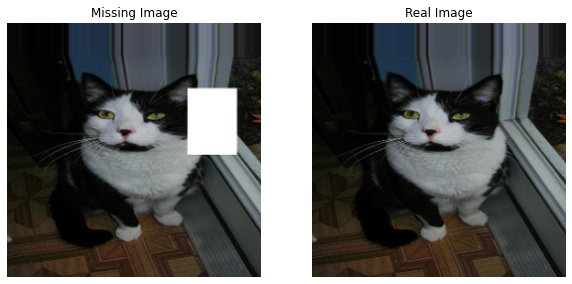

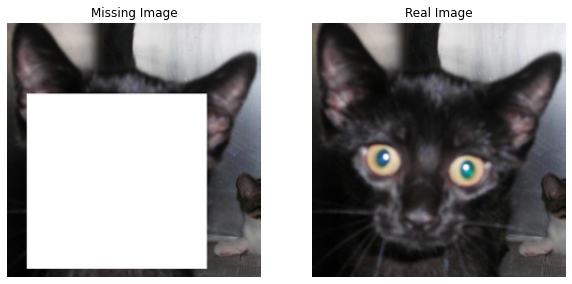

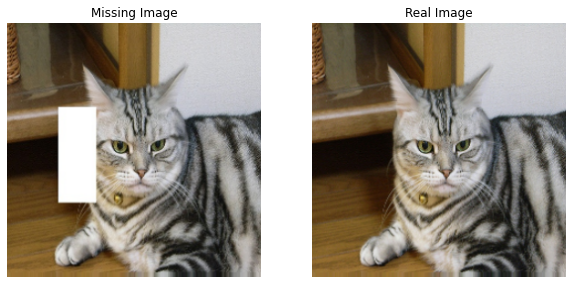

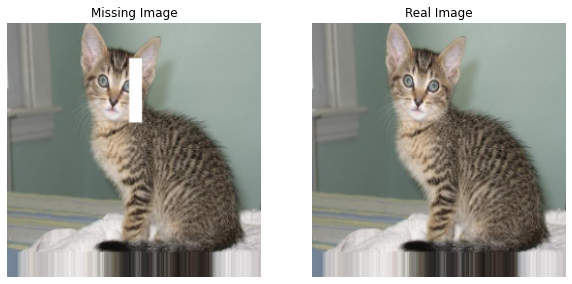

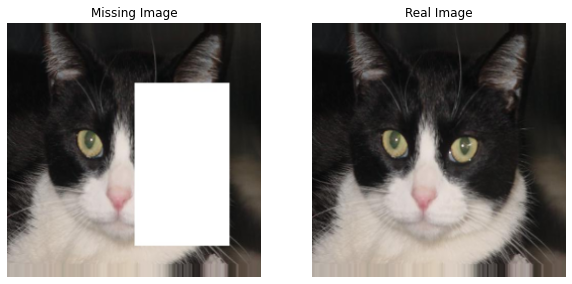

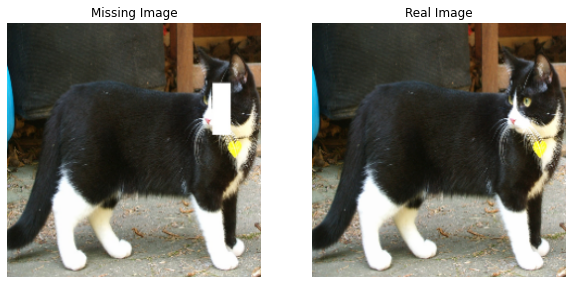

In [16]:
train_dataset = shuffle(train_dataset)

for i,batch in enumerate(train_dataset):
  x , y = augment(batch[0],batch[1],data_trans)
  plotXY(x,y)
  if i == 5:
    break

## Generator

The generator model's responsibility is to get a input image with a missing section and generate a real looking image of the missing section.</br>
For the generator we use a encoder decoder architecture. As mentioned above we took inspration from the <a href = https://arxiv.org/abs/1611.07004>"Image-to-Image Translation with Conditional Adversarial Networks"</a> by Professor "Phillip Isola" from MIT. and implemented a generator similar to the architecture suggested in the artical. We also tried to implement a few tips from a <a href = "https://www.youtube.com/watch?v=X1mUN6dD8uE&ab_channel=DavidLopez-Paz">NIPS 2016 Workshop on Adversarial Training - Soumith Chintala - How to train a GAN</a> lecture by Soumith Chintala from the Facebook Ai Research team.
<h4>Architecture</h4>
The generator is an encoder-decoder model using a U-Net architecture. The model takes a source image and generates a target image. It does this by first downsampling the input image down to a bottleneck layer, then upsampling the bottleneck representation to the size of the output image. The U-Net architecture means that skip-connections are added between the encoding layers and the corresponding decoding layers, forming a U-shape.</br>As done in the artical "Weights were initialized from a Gaussian distribution with mean 0 and
standard deviation 0.02".</br>
This model has resulted 40 milion parameters, almost 2 times less then the experiment 1 and 2 models, this is duo to the removal of the fully connected layer.</br>
<h4>Encoder</h4>
The encoder has 7 Conv2D layers with filter size of 64->128->256->512->512->512->512, kernel size of (4,4), strides of 2, LeakyReLU as activation function and padding as same. We used Batch normalization after each layer except the first and last.</br>
<h4>Decoder</h4>
The decoder's architecture is the inverted encoder architecture consisting of 7 Conv2D layers with filter size of 512->512->512->256->128->64->3, kernel size of (4,4), strides of 2, LeakyReLU as activation function except for the last layer where we used the tanh activation function to output a image with pixles in range [-1,1] to match the input and padding as same. We used Batch normalization after each layer except the last.
<h5>Few of the tips impemented are:</h5>
Batch normalization after each layer except the first and last.</br>
The use of "LeakuReLU" as a activation function insted of "relu".</br>
Using strided convolution layers instead of MaxPooling layers.</br>
Normlizing the images between -1 and 1.

In [17]:
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g
 
# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	if not skip_in == None:
		g = Concatenate()([g, skip_in])
	# relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g
 
# define the standalone generator model
def define_generator(image_shape=(256,256,3)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# image input
	in_image = Input(shape=image_shape)
	# encoder model
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e6)
	b = LeakyReLU(alpha=0.2)(b)
	# decoder model
	d1 = decoder_block(b, e6, 512)
	d2 = decoder_block(d1, e5, 512)
	d3 = decoder_block(d2, e4, 512, dropout=False)
	d4 = decoder_block(d3, e3, 256, dropout=False)
	d5 = decoder_block(d4, e2, 128, dropout=False)
	d6 = decoder_block(d5, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d6)
	out_image = Activation('tanh')(g)
	# define model
	model = Model(in_image, out_image)
	return model

In [18]:
g_model = define_generator(input_shape)
g_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 3136        input_1[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 128, 128, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 128)  131200      leaky_re_lu[0][0]                
______________________________________________________________________________________________

In [19]:
plot_model(g_model, show_shapes=True, show_layer_names=True)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


## Discriminator

The discriminator model's responsibility is to get a input image and determine of the image is real or fake. This model is the generator's adversary and will be used to update the generators weights and help it generate more real looking images.<br>
<h4>Architecture</h4>
For this experiment we abandoned the "PatchGAN" approach because we felt it did is ineffective for our experiment because there is only 1 missing region so most patchs are not needed.</br>
We used the same architecture as experiment number 3 with the only diffrence that the output is 1 neuron insted of a 8x8x1 map of patchs.
The model takes two input images, the input image and the target (real or fake) that are concatenated together and predicts the probbility to if the inputed image is real or fake.</br>
For the decoder we used a simple CNN architecture with 6 Conv2D layers with filter size of 64->128->256->512->512->1, strides of 2, LeakyReLU as activation function and padding as same. We used Batch normalization after every Conv2D layer. The last layer's size is 1x1x1 when each block is responsible over a patch of pixles from the original images, sigmoid activation function for the output layer so we get a probbility value as if the inputed image is real or fake.</br>
We compiled the model using the "Adam" optimizer and the "BinaryCrossentropy" loss for a probbility value to if the inputed image is real or fake. We weightd the loss function 0.5, following the artical.

In [20]:
def define_discriminator(image_shape):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	in_src_image = Input(shape=image_shape)
	# target image input
	in_target_image = Input(shape=image_shape)
	# concatenate images channel-wise
	merged = Concatenate()([in_src_image, in_target_image])
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	d = Flatten()(d)
	d = Dense(1)(d)
	out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], out)
	# compile model
	opt = Adam(learning_rate=D_LR, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

In [21]:
d_model = define_discriminator(input_shape)
d_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_6 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_7 (Conv2D)               (None, 128, 128, 64) 6208        concatenate_6[0][0]        

In [22]:
plot_model(d_model, show_shapes=True, show_layer_names=True)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


## The GAN Model

For this experiment we have implemented a combined model for the GAN. This combined model gets the input image with a missing region, and outputs 2 values. The first is the discriminator's output to if the generated image is real or fake, the second output is the generated image. We diabled the learning for the discriminator in this model cause it will train separately. We choose the 2 loss functions "BinaryCrossentropy" and "L1" for the corresponding adversarial and reconstruction loss. We weightd the loss functiosn 100 to 1 in favor of the L1 loss, following the artical.</br>
Our choice of L1 insted of L2 is inspired by the artical stating:</br>
"We also explore this option, using L1 distance rather than L2 as
L1 encourages less blurring".


In [23]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False
	# define the source image
	in_src = Input(shape=image_shape)
	# connect the source image to the generator input
	gen_out = g_model(in_src)
	# connect the source input and generator output to the discriminator input
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and classification output
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(learning_rate=G_LR, beta_1=0.5)
	model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[3,98])
	return model

In [24]:
gan_model = define_gan(g_model, d_model, input_shape)

In [25]:
plot_model(gan_model, show_shapes=True, show_layer_names=True)

('You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) ', 'for plot_model/model_to_dot to work.')


## Training

In [47]:
def plot_prediction(missing_imgs, real_imgs, generated_imgs,save_path = None):
  
  n_plots = len(missing_imgs)
  plt.figure(figsize=(12, 4 * n_plots))
  for i in range(n_plots):

    missing_img = missing_imgs[i]
    real_img = real_imgs[i]
    generated_img = generated_imgs[i]

    plt.subplot(n_plots, 3,3*i + 1)
    if i == 0:
      plt.title('Missing Image')
    missing_img = missing_img.copy()
    missing_img = (missing_img + 1)*127.5
    missing_img = missing_img.astype("int16")
    plt.axis('off')
    plt.imshow(missing_img)

    plt.subplot(n_plots, 3,3*i + 2)
    if i == 0:
      plt.title('Real Image')
    real_img = real_img.copy()
    real_img = (real_img + 1)*127.5
    real_img = real_img.astype("int16")
    plt.imshow(real_img)
    plt.axis('off')

    plt.subplot(n_plots, 3,3*i + 3)
    if i == 0:
      plt.title('Full Generated Image')
    generated_img = generated_img.copy()
    generated_img = (generated_img + 1)*127.5
    generated_img = generated_img.astype("int16")
    plt.axis('off')
    plt.imshow(generated_img)

    '''plt.subplot(n_plots, 4,4*i + 4)
    plt.title('Generated Image')
    generated_img = fill_image(missing_img,generated_img)
    plt.imshow(generated_img)
    plt.axis('off')'''

  if save_path:
    plt.savefig(save_path)
    
  plt.show()

In [27]:
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, x_input, patch_shape):
		# generate fake instance
		X = g_model.predict(x_input)
		# create 'fake' class labels (0)
		y = zeros((len(X), 1))
		return X, y

In [37]:
# generate samples and save as a plot and save the model
def summarize_performance(g_model, dataset, n_samples=5,save_model = False, save_plot = False,epoch = None):
		index = random.randrange(len(dataset) - n_samples)
		epochstr = ""
		if epoch:
			epochstr= f"_epoch_{epoch}"

		reals = []
		targets = []
		fakes = []
		for i in range(index,index + n_samples):
			
				# select a sample of input images
				X_real_input = dataset[i,0]
				X_real_target =  dataset[i,1]
				# generate a batch of fake samples
				X_fake_output, _ = generate_fake_samples(g_model, X_real_input.reshape(1,IMG_DIM,IMG_DIM,3), 1)
				# plot real source images
				reals.append(X_real_input)
				targets.append(X_real_target)
				fakes.append(X_fake_output[0])
		if save_plot:
			plot_path = f'{models_path}/{experiance_name}_g_plot{epochstr}_{i - index + 1}.png'
			plot_prediction(reals,targets,fakes,plot_path)
		else:
			plot_prediction(reals,targets,fakes)
		if save_model:
				print("saving models")
				# save the generator model
				g_model.save(f'{models_path}/{experiance_name}_g{epochstr}.h5')

We rewrote our training function to match the new models layout altho it is still similar to the previus one. We go through the dataset "epochs" times, for each epoch we go through each batch, augment it, feed it to the discriminator, then we feed the batch to the GAN model, and print the ongoing progress.
<h5>History</h5>
After each epoch we keep track of a few variables such as "Generator Total (joint) Loss" and "Discriminator Adversarial Loss". We print these variables and keep track of them in the "history" lists.</br>
<h5>Model Evaluation</h5>
Because evaluating a GAN model is not as simple as it is in a clasic "Classification" problem, where you compute the loss and accuracy of the model compered to the expected output and display them via a confusion matrix and such... Evaluating a GAN model is far less simple , as stated in the <a href = https://machinelearningmastery.com/how-to-evaluate-generative-adversarial-networks/>How to Evaluate Generative Adversarial Networks</a> artical by "Jason Brownlee PhD":</br>"There is no objective function used when training GAN generator models, meaning models must be evaluated using the quality of the generated synthetic images".</br>
"Manual inspection of generated images is a good starting point when getting started".</br>
Therefore we use visual evaluation by displaying 5 generated images alongside the target images from a validation dataset.

In [34]:
# train pix2pix model
def train_gan(d_model, g_model, gan_model, dataset, test_dataset, epochs ,transformer, n_batch=1, start_epoch = 0,  save_after_epoch = 30):
    # vars to track history
    history_g_loss = []
    history_d_loss = []

    # determine the output square shape of the discriminator
    d_patch_dim = d_model.output_shape[1]
    # calculate the number of batches per training epoch
    data_len = len(dataset) 

    time = timer()

    # give dataset a batch dimantion
    dataset = dataset.reshape((len(dataset), 2, 1, IMG_DIM, IMG_DIM, 3))

    for epoch in range(start_epoch,start_epoch + epochs):
        # vars to track loss in epoch
        g_total_loss = 0
        d_loss_real_sum = 0
        d_loss_fake_sum = 0
        
        i = 0
        for batch in dataset:
            # get inputs for discriminator
            # select a batch of real samples
            X_real_input, X_real_target = augment(batch[0].copy(),batch[1].copy(),transformer)
            y_real  = ones((1, 1))

            # generate a batch of fake samples
            X_fake_output, y_fake = generate_fake_samples(g_model, X_real_input, d_patch_dim)

            # train discriminator
            # update discriminator for real samples
            d_loss_r = d_model.train_on_batch([X_real_input, X_real_target], y_real)
            # update discriminator for generated samples
            d_loss_f = d_model.train_on_batch([X_real_input, X_fake_output], y_fake)

            # train generator
            # update the generator
            g_loss, _, _ = gan_model.train_on_batch(X_real_input, [y_real, X_real_target])

            # track vars
            g_total_loss += g_loss
            d_loss_real_sum += d_loss_r
            d_loss_fake_sum += d_loss_f

            # print
            i += 1
            print("\r"+"Epoch number: {}/{}, Batch: {}/{}, G Loss:{:0.4f}, D Loss Real:{:0.4f}, D Loss Fake:{:0.4f}".format(
                epoch + 1,start_epoch + epochs,i,data_len,g_total_loss / i,d_loss_real_sum / i,d_loss_fake_sum / i), end="")
            
        # epoch ended
        # vars to summorize epoch for printing and history
        g_epoch_total_loss = g_total_loss / data_len
        d_epoch_real_loss = d_loss_real_sum / data_len
        d_epoch_fake_loss = d_loss_fake_sum / data_len
        d_epoch_loss = (d_epoch_real_loss + d_epoch_fake_loss) / 2 

        # appending history
        history_g_loss.append(g_epoch_total_loss)
        history_d_loss.append(d_epoch_loss)

        # printing
        print("\n\nFinished Epoch: {},\nGenerator Loss:{:0.4f}, Discriminator Total Loss:{:0.2f}, \nDiscriminator Real Loss:{:0.4f}, Discriminator Fake Loss:{:0.2f}".format(
          epoch+1,g_epoch_total_loss,d_epoch_loss,d_epoch_real_loss,d_epoch_fake_loss))

        # shuffle data
        dataset = shuffle(dataset)
        # save if epoch > 10
        save = epoch >= save_after_epoch
        # summarize performance on test set
        summarize_performance(g_model, test_dataset, n_samples=5,save_model = save,epoch=epoch+1)

    # training end
    total_time = round((timer() - time)/60)
    print(f"Finished training after {total_time} minutes.")

    history = {}

    history['g_loss'] = history_g_loss
    history['d_loss'] = history_d_loss
    return history

Epoch number: 1/20, Batch: 4521/4521, G Loss:12.2816, D Loss Real:0.5621, D Loss Fake:0.5341

Finished Epoch: 1,
Generator Loss:12.2816, Discriminator Total Loss:0.55, 
Discriminator Real Loss:0.5621, Discriminator Fake Loss:0.53


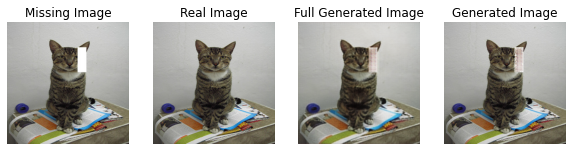

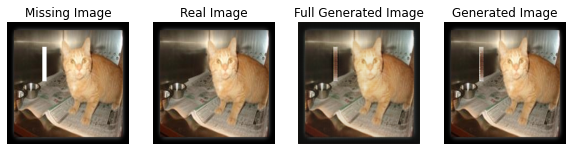

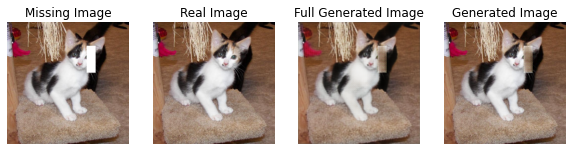

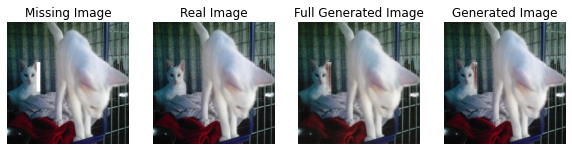

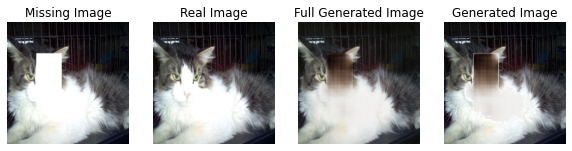

Epoch number: 2/20, Batch: 4521/4521, G Loss:7.9935, D Loss Real:0.4043, D Loss Fake:0.4130

Finished Epoch: 2,
Generator Loss:7.9935, Discriminator Total Loss:0.41, 
Discriminator Real Loss:0.4043, Discriminator Fake Loss:0.41


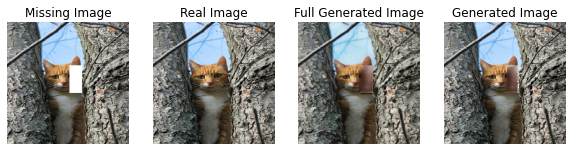

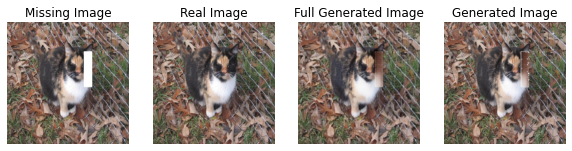

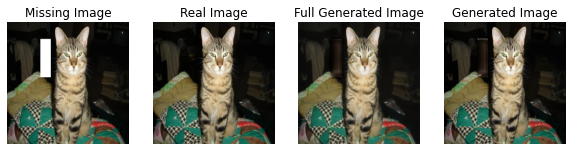

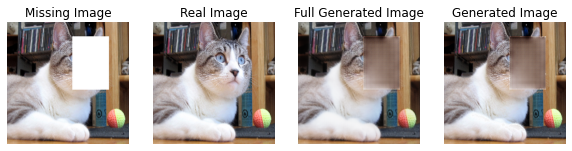

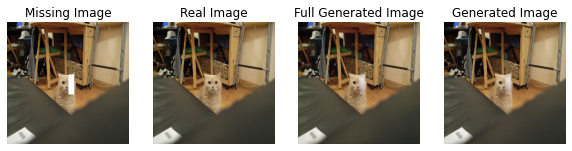

Epoch number: 3/20, Batch: 4521/4521, G Loss:6.7907, D Loss Real:0.3866, D Loss Fake:0.3938

Finished Epoch: 3,
Generator Loss:6.7907, Discriminator Total Loss:0.39, 
Discriminator Real Loss:0.3866, Discriminator Fake Loss:0.39


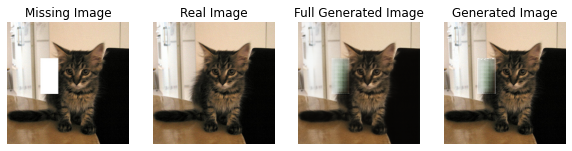

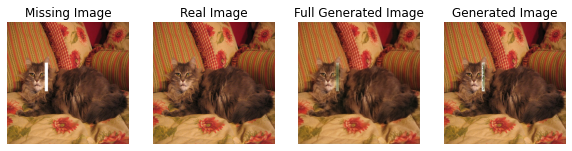

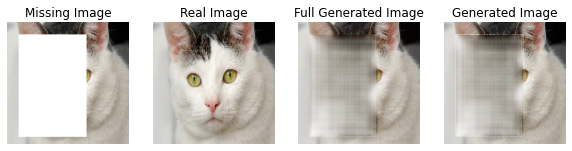

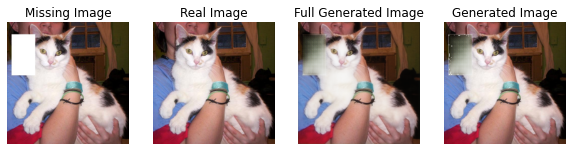

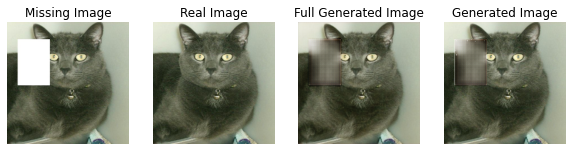

Epoch number: 4/20, Batch: 4521/4521, G Loss:6.1635, D Loss Real:0.3711, D Loss Fake:0.3798

Finished Epoch: 4,
Generator Loss:6.1635, Discriminator Total Loss:0.38, 
Discriminator Real Loss:0.3711, Discriminator Fake Loss:0.38


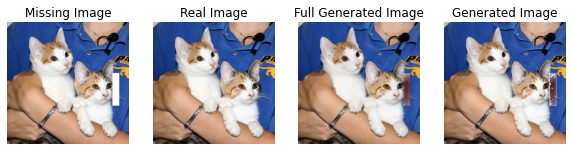

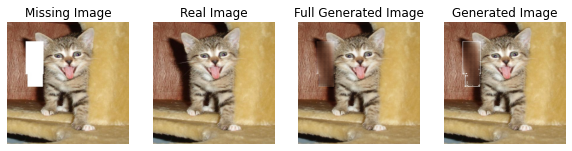

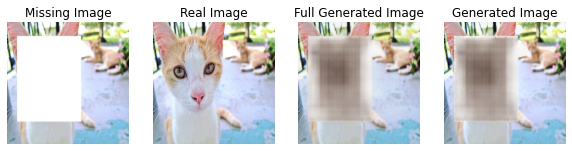

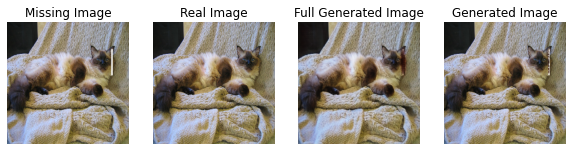

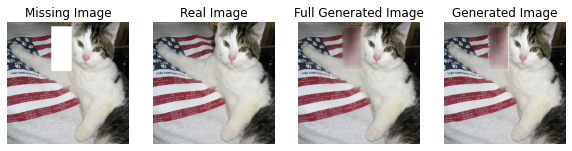

Epoch number: 5/20, Batch: 4521/4521, G Loss:5.7954, D Loss Real:0.3574, D Loss Fake:0.3712

Finished Epoch: 5,
Generator Loss:5.7954, Discriminator Total Loss:0.36, 
Discriminator Real Loss:0.3574, Discriminator Fake Loss:0.37


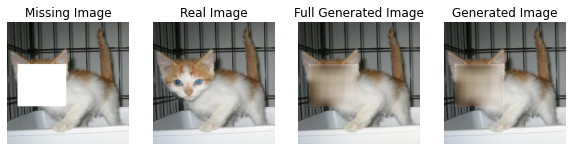

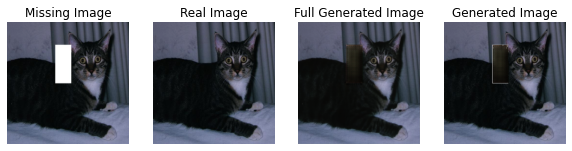

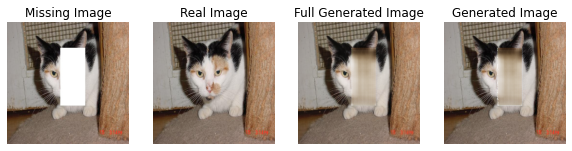

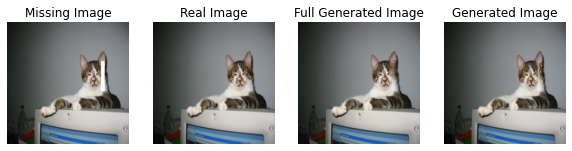

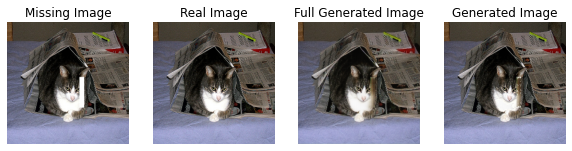

Epoch number: 6/20, Batch: 4521/4521, G Loss:5.5311, D Loss Real:0.3526, D Loss Fake:0.3659

Finished Epoch: 6,
Generator Loss:5.5311, Discriminator Total Loss:0.36, 
Discriminator Real Loss:0.3526, Discriminator Fake Loss:0.37


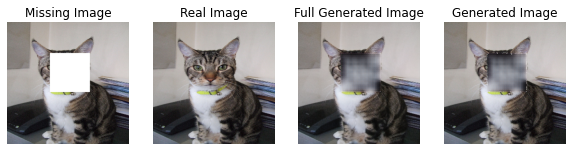

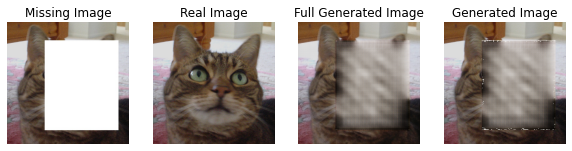

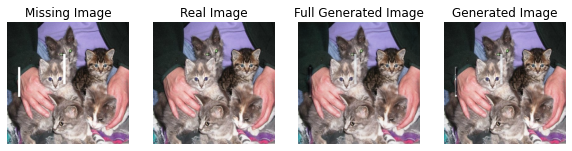

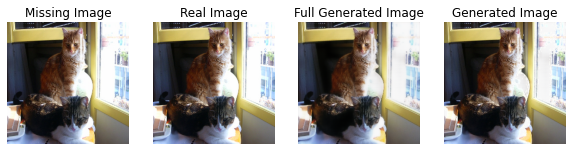

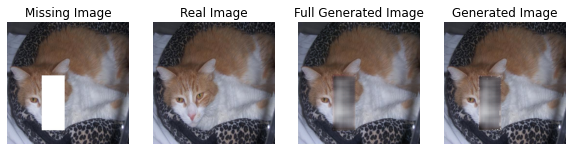

Epoch number: 7/20, Batch: 4521/4521, G Loss:5.3822, D Loss Real:0.3478, D Loss Fake:0.3629

Finished Epoch: 7,
Generator Loss:5.3822, Discriminator Total Loss:0.36, 
Discriminator Real Loss:0.3478, Discriminator Fake Loss:0.36


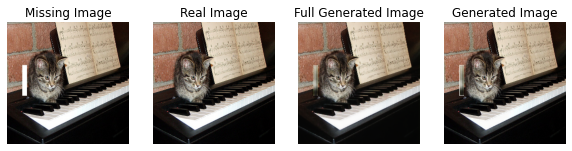

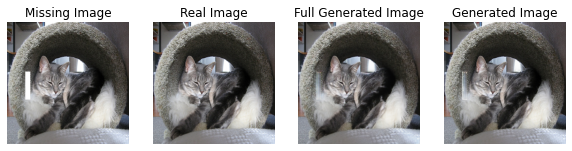

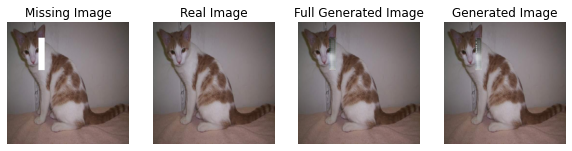

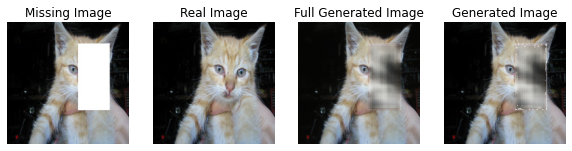

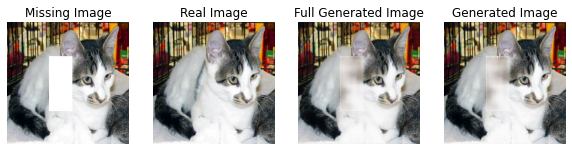

Epoch number: 8/20, Batch: 4521/4521, G Loss:5.2718, D Loss Real:0.3450, D Loss Fake:0.3619

Finished Epoch: 8,
Generator Loss:5.2718, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3450, Discriminator Fake Loss:0.36


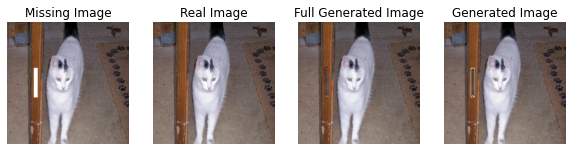

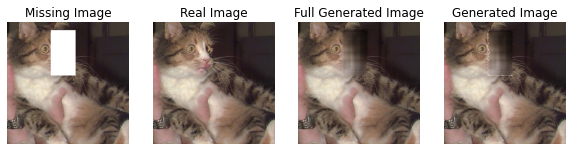

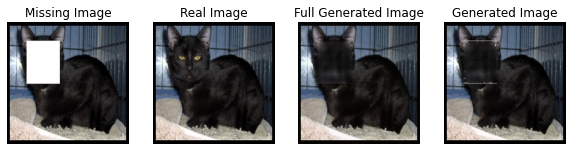

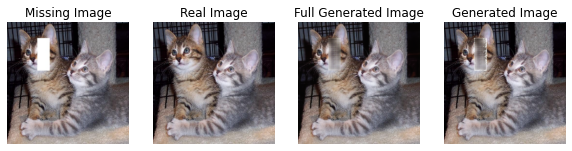

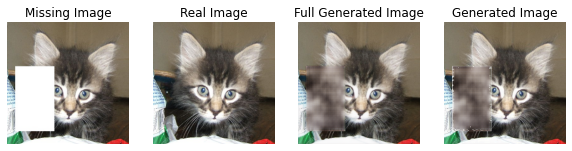

Epoch number: 9/20, Batch: 4521/4521, G Loss:5.1923, D Loss Real:0.3443, D Loss Fake:0.3610

Finished Epoch: 9,
Generator Loss:5.1923, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3443, Discriminator Fake Loss:0.36


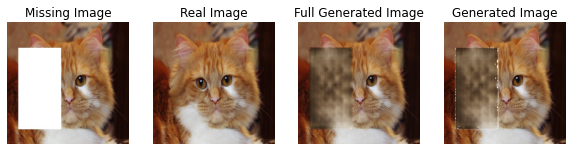

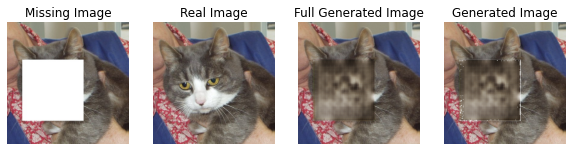

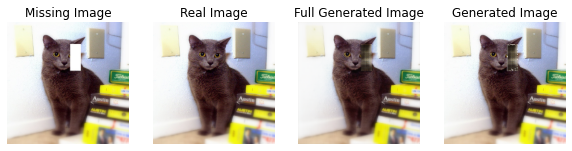

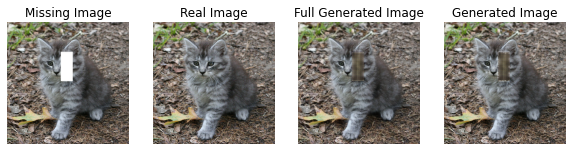

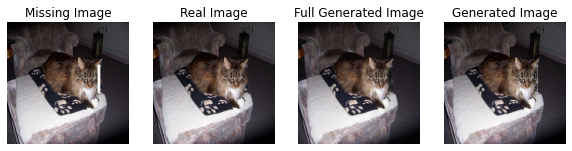

Epoch number: 10/20, Batch: 4521/4521, G Loss:5.1143, D Loss Real:0.3410, D Loss Fake:0.3588

Finished Epoch: 10,
Generator Loss:5.1143, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3410, Discriminator Fake Loss:0.36


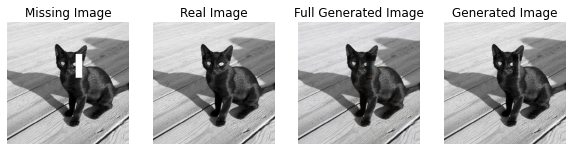

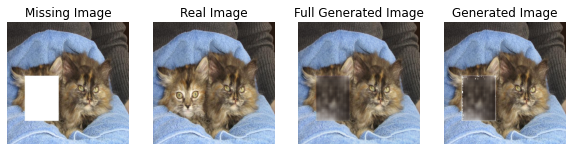

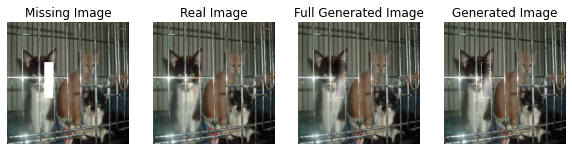

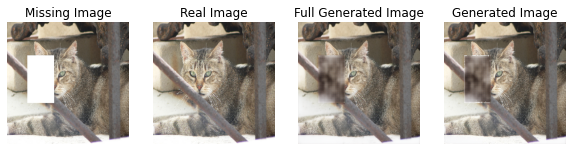

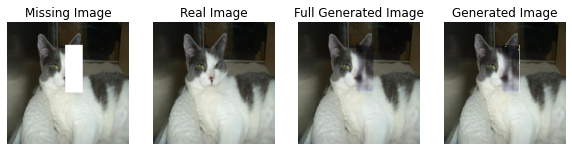

saving models
Epoch number: 11/20, Batch: 4521/4521, G Loss:5.0811, D Loss Real:0.3406, D Loss Fake:0.3560

Finished Epoch: 11,
Generator Loss:5.0811, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3406, Discriminator Fake Loss:0.36


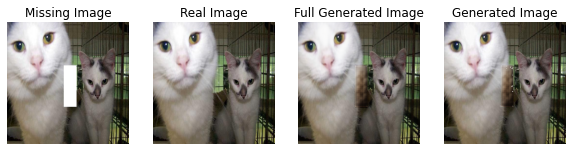

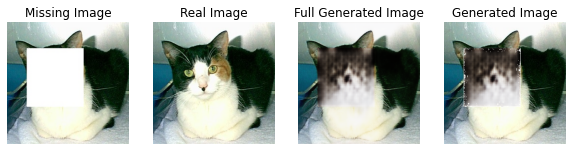

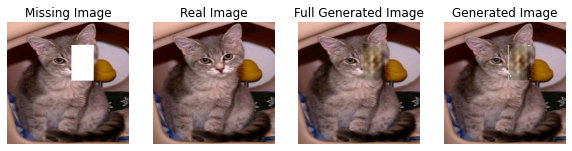

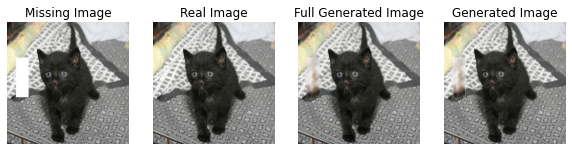

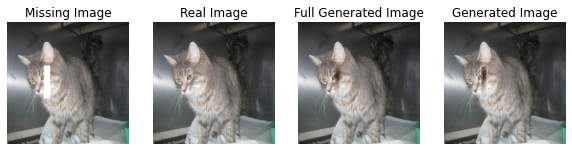

saving models
Epoch number: 12/20, Batch: 4521/4521, G Loss:5.0311, D Loss Real:0.3419, D Loss Fake:0.3537

Finished Epoch: 12,
Generator Loss:5.0311, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3419, Discriminator Fake Loss:0.35


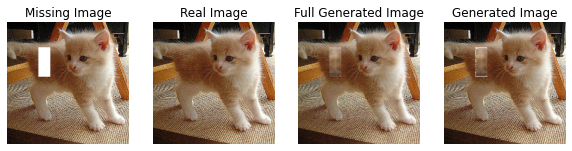

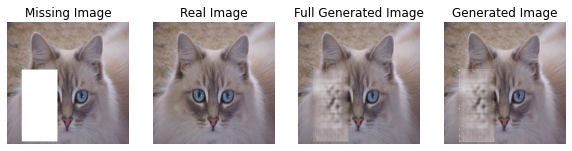

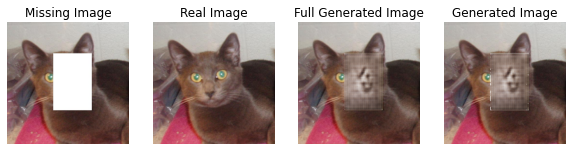

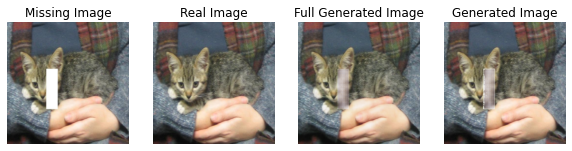

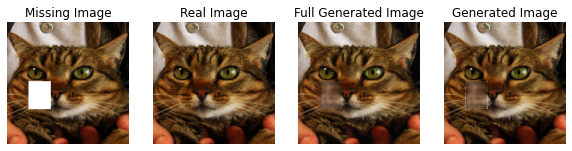

saving models
Epoch number: 13/20, Batch: 4521/4521, G Loss:4.9105, D Loss Real:0.3336, D Loss Fake:0.3605

Finished Epoch: 13,
Generator Loss:4.9105, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3336, Discriminator Fake Loss:0.36


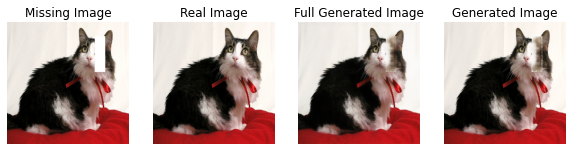

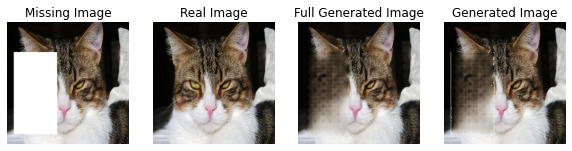

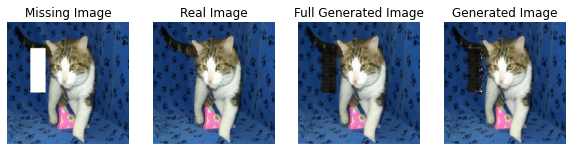

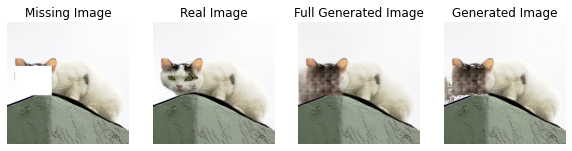

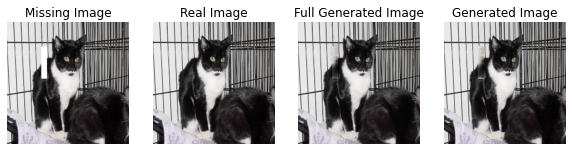

saving models
Epoch number: 14/20, Batch: 4521/4521, G Loss:5.2284, D Loss Real:0.3313, D Loss Fake:0.3517

Finished Epoch: 14,
Generator Loss:5.2284, Discriminator Total Loss:0.34, 
Discriminator Real Loss:0.3313, Discriminator Fake Loss:0.35


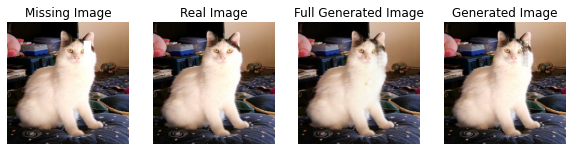

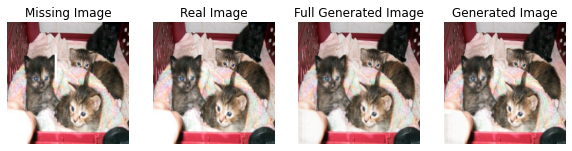

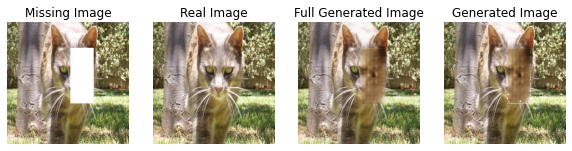

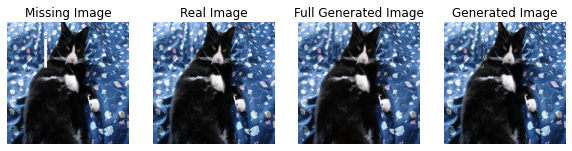

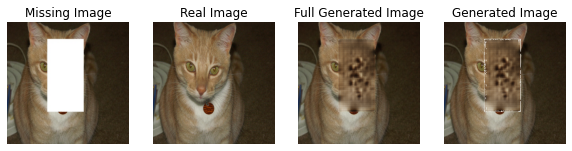

saving models
Epoch number: 15/20, Batch: 4521/4521, G Loss:4.8493, D Loss Real:0.3417, D Loss Fake:0.3566

Finished Epoch: 15,
Generator Loss:4.8493, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3417, Discriminator Fake Loss:0.36


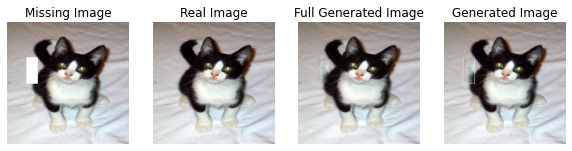

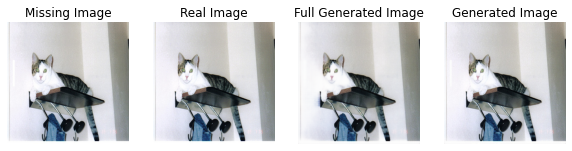

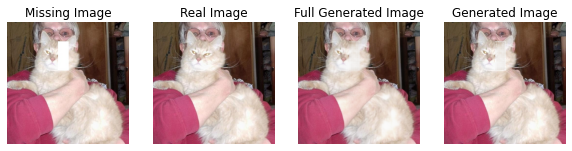

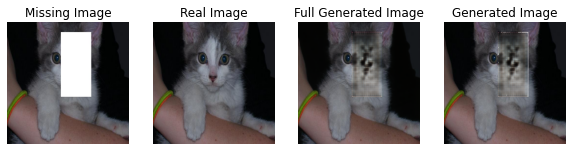

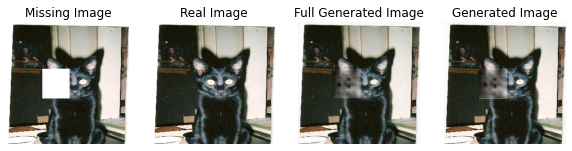

saving models
Epoch number: 16/20, Batch: 4521/4521, G Loss:4.7976, D Loss Real:0.3435, D Loss Fake:0.3545

Finished Epoch: 16,
Generator Loss:4.7976, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3435, Discriminator Fake Loss:0.35


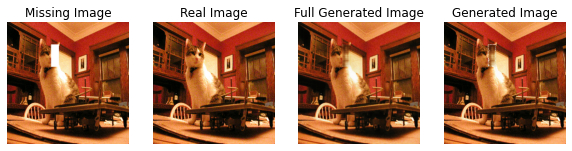

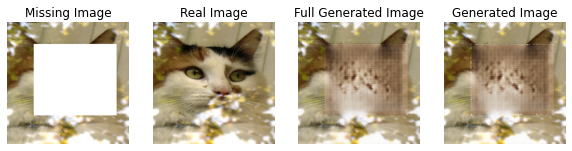

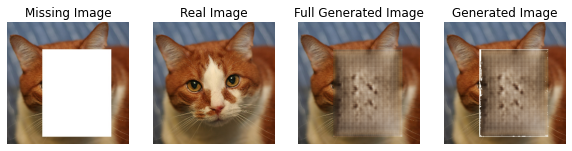

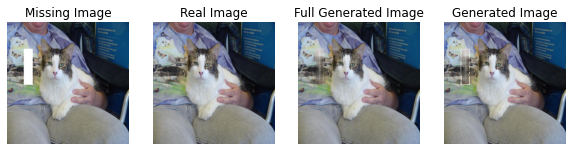

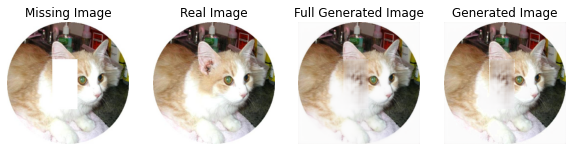

saving models
Epoch number: 17/20, Batch: 4521/4521, G Loss:4.7597, D Loss Real:0.3461, D Loss Fake:0.3540

Finished Epoch: 17,
Generator Loss:4.7597, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3461, Discriminator Fake Loss:0.35


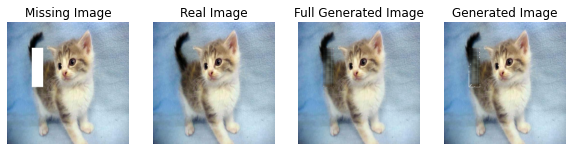

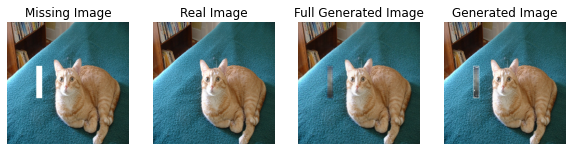

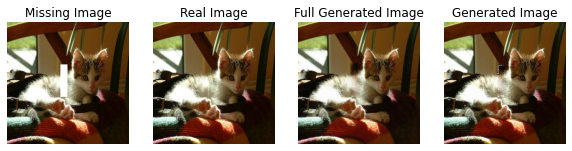

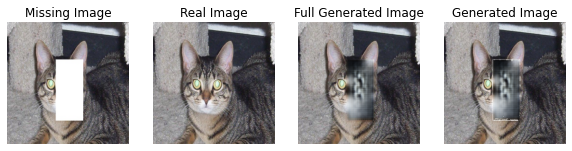

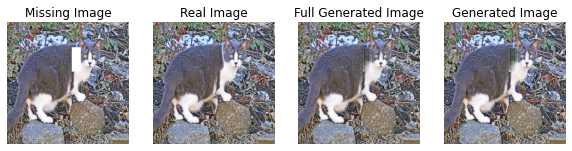

saving models
Epoch number: 18/20, Batch: 4521/4521, G Loss:4.6965, D Loss Real:0.3469, D Loss Fake:0.3534

Finished Epoch: 18,
Generator Loss:4.6965, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3469, Discriminator Fake Loss:0.35


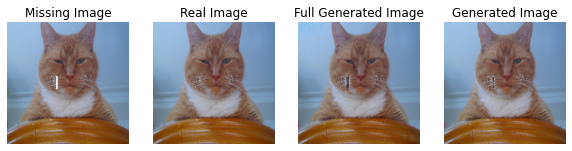

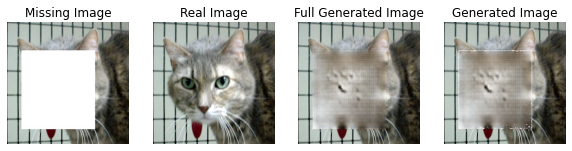

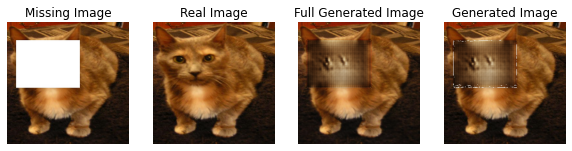

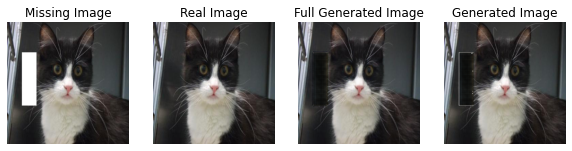

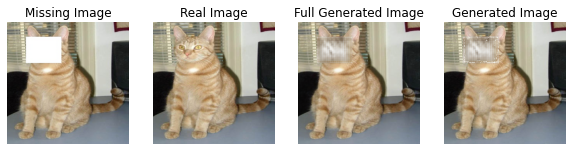

saving models
Epoch number: 19/20, Batch: 4521/4521, G Loss:4.7319, D Loss Real:0.3524, D Loss Fake:0.3565

Finished Epoch: 19,
Generator Loss:4.7319, Discriminator Total Loss:0.35, 
Discriminator Real Loss:0.3524, Discriminator Fake Loss:0.36


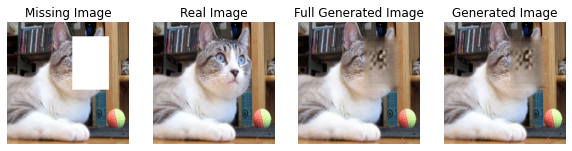

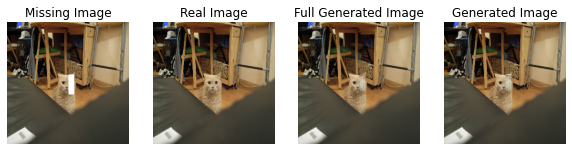

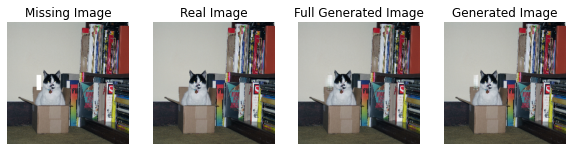

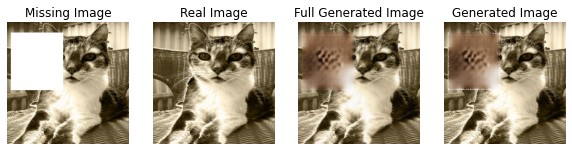

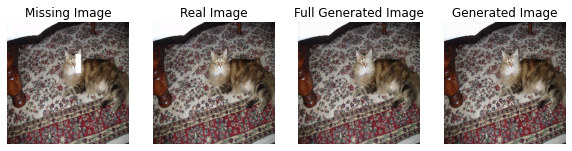

saving models
Epoch number: 20/20, Batch: 3731/4521, G Loss:4.6635, D Loss Real:0.3554, D Loss Fake:0.3590

KeyboardInterrupt: 

In [30]:
history = train_gan(d_model, g_model, gan_model, train_dataset,test_dataset,EPOCHS,data_trans)

Now that the training process is done after 242 minuts, we will plot the history and evaluate the model on a test set.

In [ ]:
g_model.save(f'{models_path}/{experiance_name}_g.h5')

## Evaluate

In [ ]:
def plot_loss(history):
  plt.plot(history['g_loss'])
  plt.plot(history['d_loss'])
  plt.title('gan loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['generator', 'discriminator'], loc='upper left')
  plt.show()

In [ ]:
plot_loss(history)

In [ ]:
# choose best model
g_model = keras.models.load_model(f'{models_path}/{experiance_name}_g.h5')

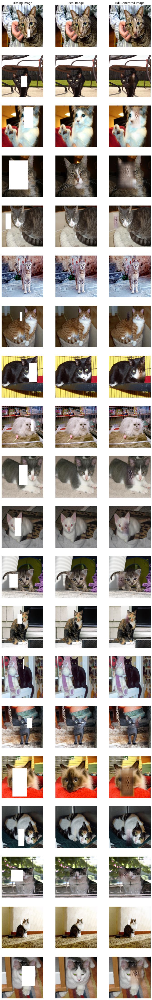

In [48]:
summarize_performance(g_model, test_dataset,n_samples=10)

<h4>Conclusions</h4>
We see that this model is far better at reconstucting the image in a sharper way compered to the previus models, this is most likely due to the improved discriminator architecture and the weights for each joint loss function.</br>
With that being said, the model somtimes outputs a cat with diffrent colors to the cat in the input image. This is most likely due to the increase in the adversarial loss and and lack of dropout and epochs.